# Laboratory #4_1 : Image Classification using CNN

At the end of this laboratory, you would get familiarized with

*   Creating deep networks using Keras
*   Steps necessary in training a neural network
*   Prediction and performance analysis using neural networks
*   Using pre-trained networks
*   Feature visualizations

**Remember this is a graded exercise.**

*   For every plot, make sure you provide appropriate titles, axis labels, legends, wherever applicable.
*   Create reusable functions where ever possible, so that the code could be reused at different places.
*   Mount your drive to access the images.
*   Add sufficient comments and explanations wherever necessary.

---

# **Colaboratory environment**
By default, Colab notebooks run on CPU.
You can switch your notebook to run with GPU.

In order to obtain access to the GPU, you need to choose the tab Runtime and then select “Change runtime type” as shown in the following figure:

![Changing runtime](https://miro.medium.com/max/747/1*euE7nGZ0uJQcgvkpgvkoQg.png)

When a pop-up window appears select GPU. Ensure “Hardware accelerator” is set to GPU.

# **Working with a new dataset: CIFAR-10**

The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images. More information about CIFAR-10 can be found [here](https://www.cs.toronto.edu/~kriz/cifar.html).

In Keras, the CIFAR-10 dataset is also preloaded in the form of four Numpy arrays. x_train and y_train contain the training set, while x_test and y_test contain the test data. The images are encoded as Numpy arrays and their corresponding labels ranging from 0 to 9.

Your task is to:

*   Visualize the images in CIFAR-10 dataset. Create a 10 x 10 plot showing 10 random samples from each class.
*   Convert the labels to one-hot encoded form.
*   Normalize the images.




In [11]:
# solution
import keras

data = keras.datasets.cifar10.load_data()
labels = ["airplane", "automobile", "bird", "cat", "deer", 
          "dog", "frog", "horse", "ship", "truck"]
(x_train, y_train), (x_test, y_test) = data

INPUT_SHAPE = (32, 32, 3)
NUM_CLASSES = 10

print("Data Sizes")
print("x_train: ", x_train.shape)
print("y_train: ", y_train.shape)
print("x_test: ", x_test.shape)
print("y_test: ", y_test.shape)

Data Sizes
x_train:  (50000, 32, 32, 3)
y_train:  (50000, 1)
x_test:  (10000, 32, 32, 3)
y_test:  (10000, 1)


After loading the dataset, you can plot the images using matplotlib as follows:

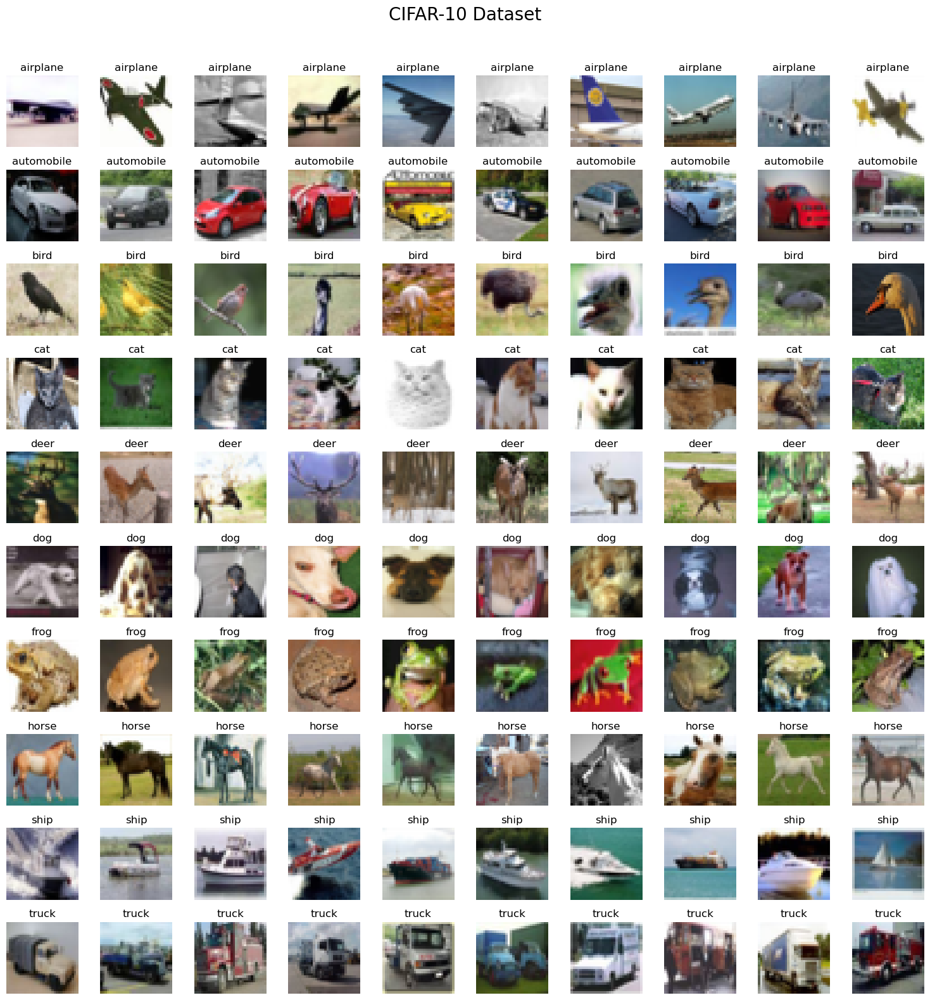

In [12]:
import matplotlib.pyplot as plt
import numpy as np
fig, ax = plt.subplots(10, 10, figsize=(15, 15))

for i in range(10):
    rand_idx_i =np.random.choice(np.where(y_train[:, 0] == i)[0], 10)
    for j in range(10):
        ax[i, j].imshow(x_train[rand_idx_i[j]])
        ax[i, j].axis('off')
        ax[i, j].set_title(labels[i])

plt.tight_layout()
plt.suptitle("CIFAR-10 Dataset", y=1.05, fontsize=20)
plt.show()

Normalizing the images is a common preprocessing step. It involves scaling the pixel values to zero mean and unit variance. It is done so that the input features have similar orders of magnitude. In our case, the pixel values range from 0 to 255. So, we normalize the images by dividing by 255.0.

In [13]:
x_train, x_test = x_train / 255.0, x_test / 255.0

Labels are provided as integer values ranging from 0 to 9. Convert the labels to one-hot encoded form.

In [14]:
y_train[:10]

array([[6],
       [9],
       [9],
       [4],
       [1],
       [1],
       [2],
       [7],
       [8],
       [3]], dtype=uint8)

In [15]:
# convert class vectors to binary class matrices
num_classes = 10
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

print(y_train[:10])

[[0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]]


## Define the following model (same as the one in tutorial)

**For the convolutional front-end, start with a single convolutional layer with a small filter size (3,3) and a modest number of filters (32) followed by a max pooling layer. Use the input as (32,32,3). The filter maps can then be flattened to provide features to the classifier. Use a dense layer with 100 units before the classification layer (which is also a dense layer with softmax activation).**

In [16]:
from keras.backend import clear_session
clear_session()

In [17]:
# solution

from keras.models import Sequential

model = [keras.layers.InputLayer(input_shape=INPUT_SHAPE),
         keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu'),
         keras.layers.MaxPooling2D(pool_size=(2, 2)),
         keras.layers.Flatten(),
         keras.layers.Dense(100, activation='relu'),
         keras.layers.Dense(NUM_CLASSES, activation='softmax')]

model = Sequential(model)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 15, 15, 32)        0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 7200)              0         
                                                                 
 dense (Dense)               (None, 100)               720100    
                                                                 
 dense_1 (Dense)             (None, 10)                1010      
                                                                 
Total params: 722006 (2.75 MB)
Trainable params: 722006 (2.75 MB)
Non-trainable params: 0 (0.00 Byte)
____________________

*   Compile the model using categorical_crossentropy loss, SGD optimizer and use 'accuracy' as the metric.
*   Use the above defined model to train CIFAR-10 and train the model for 512 epochs with a batch size of 32.

In [18]:
# solution
BATCH_SIZE = 32
EPOCHS = 40
LEARNING_RATE = 0.01
model.compile(loss=keras.losses.CategoricalCrossentropy(),
                optimizer=keras.optimizers.SGD(),
                metrics=['accuracy'])

history = model.fit(x_train, y_train,
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    validation_data=(x_test, y_test))


Epoch 1/40


2023-12-01 13:21:40.581059: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f0a68a93190 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-12-01 13:21:40.581074: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4070 Laptop GPU, Compute Capability 8.9
2023-12-01 13:21:40.620527: W tensorflow/compiler/xla/service/gpu/llvm_gpu_backend/gpu_backend_lib.cc:543] Can't find libdevice directory ${CUDA_DIR}/nvvm/libdevice. This may result in compilation or runtime failures, if the program we try to run uses routines from libdevice.
Searched for CUDA in the following directories:
  ./cuda_sdk_lib
  /usr/local/cuda-11.8
  /usr/local/cuda
  .
You can choose the search directory by setting xla_gpu_cuda_data_dir in HloModule's DebugOptions.  For most apps, setting the environment variable XLA_FLAGS=--xla_gpu_cuda_data_dir=/path/to/cuda will work.
2023-12-01 13:21:40.644515: I ./tensorflow/compi

1563/1563 [==============================] - 3s 1ms/step - loss: 1.8926 - accuracy: 0.3278 - val_loss: 1.6793 - val_accuracy: 0.4088
Epoch 2/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.5392 - accuracy: 0.4564 - val_loss: 1.5105 - val_accuracy: 0.4700
Epoch 3/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.3569 - accuracy: 0.5219 - val_loss: 1.3048 - val_accuracy: 0.5373
Epoch 4/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.2584 - accuracy: 0.5599 - val_loss: 1.2478 - val_accuracy: 0.5597
Epoch 5/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.1883 - accuracy: 0.5843 - val_loss: 1.2582 - val_accuracy: 0.5549
Epoch 6/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.1254 - accuracy: 0.6069 - val_loss: 1.1900 - val_accuracy: 0.5829
Epoch 7/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.0726 - accuracy: 0.6251 - val_loss: 1.2563 - val_accuracy: 0.5467
Epo

## Defining Deeper Architectures: VGG Models

*   Define a deeper model architecture for CIFAR-10 dataset and train the new model for 512 epochs with a batch size of 32. We will use VGG model as the architecture.

**Stack two convolutional layers with 32 filters, each of 3 x 3. Use a max pooling layer and next flatten the output of the previous layer and add a dense layer with 128 units before the classification layer. For all the layers, use ReLU activation function. Use same padding for the layers to ensure that the height and width of each layer output matches the input**


In [19]:
from keras.backend import clear_session
clear_session()

In [20]:
# solution

model_deep = [keras.layers.InputLayer(input_shape=INPUT_SHAPE),
                keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu'),
                keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu'),
                keras.layers.MaxPooling2D(pool_size=(2, 2)),
                keras.layers.Flatten(),
                keras.layers.Dense(128, activation='relu'),
                keras.layers.Dense(NUM_CLASSES, activation='softmax')]

model_deep = Sequential(model_deep)
model_deep.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 30, 30, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 32)        9248      
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 32)        0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense (Dense)               (None, 128)               802944    
                                                                 
 dense_1 (Dense)             (None, 10)                1290      
                                                        

*   Compile the model using categorical_crossentropy loss, SGD optimizer and use 'accuracy' as the metric.
*   Use the above defined model to train CIFAR-10 and train the model for 512 epochs with a batch size of 32.

In [21]:
# solution

# solution
BATCH_SIZE = 32
EPOCHS = 40
LEARNING_RATE = 0.01
model_deep.compile(loss=keras.losses.CategoricalCrossentropy(),
                optimizer=keras.optimizers.SGD(learning_rate=LEARNING_RATE),
                metrics=['accuracy'])

history_deep = model_deep.fit(x_train, y_train,
                                batch_size=BATCH_SIZE,
                                epochs=EPOCHS,
                                verbose=1,
                                validation_data=(x_test, y_test))

Epoch 1/40
1563/1563 [==============================] - 3s 2ms/step - loss: 1.8634 - accuracy: 0.3313 - val_loss: 1.5974 - val_accuracy: 0.4182
Epoch 2/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.4978 - accuracy: 0.4680 - val_loss: 1.4155 - val_accuracy: 0.4920
Epoch 3/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.3488 - accuracy: 0.5213 - val_loss: 1.3238 - val_accuracy: 0.5320
Epoch 4/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.2220 - accuracy: 0.5691 - val_loss: 1.2557 - val_accuracy: 0.5575
Epoch 5/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.1164 - accuracy: 0.6070 - val_loss: 1.1433 - val_accuracy: 0.5947
Epoch 6/40
1563/1563 [==============================] - 2s 1ms/step - loss: 1.0305 - accuracy: 0.6398 - val_loss: 1.1497 - val_accuracy: 0.5960
Epoch 7/40
1563/1563 [==============================] - 2s 1ms/step - loss: 0.9544 - accuracy: 0.6636 - val_loss: 1.1476 - val_accuracy:

*   Compare the performance of both the models by plotting the loss and accuracy curves of both the training steps. Does the deeper model perform better? Comment on the observation.
 

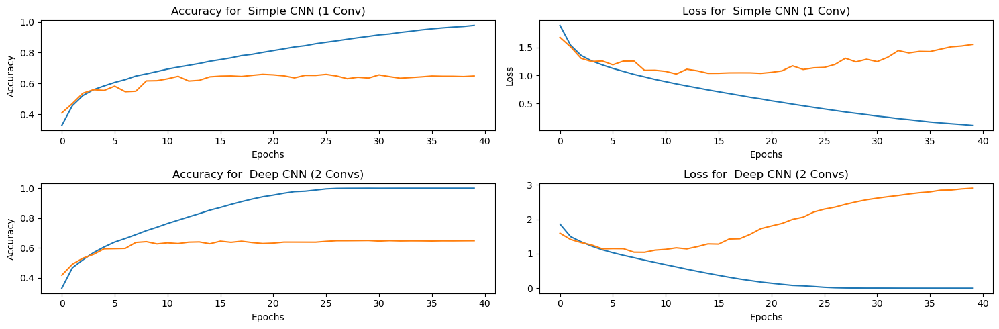

In [22]:
# solution

fig, ax = plt.subplots(2, 2, figsize=(15, 5))

ax[0, 0].plot(history.history['accuracy'], label='train')
ax[0, 0].plot(history.history['val_accuracy'], label='test')
ax[0, 0].set_title("Accuracy for  Simple CNN (1 Conv)")
ax[0, 0].set_xlabel("Epochs")
ax[0, 0].set_ylabel("Accuracy")

ax[0, 1].plot(history.history['loss'], label='train')
ax[0, 1].plot(history.history['val_loss'], label='test')
ax[0, 1].set_title("Loss for  Simple CNN (1 Conv)")
ax[0, 1].set_xlabel("Epochs")
ax[0, 1].set_ylabel("Loss")

ax[1, 0].plot(history_deep.history['accuracy'], label='train')
ax[1, 0].plot(history_deep.history['val_accuracy'], label='test')
ax[1, 0].set_title("Accuracy for  Deep CNN (2 Convs)")
ax[1, 0].set_xlabel("Epochs")
ax[1, 0].set_ylabel("Accuracy")

ax[1, 1].plot(history_deep.history['loss'], label='train')
ax[1, 1].plot(history_deep.history['val_loss'], label='test')
ax[1, 1].set_title("Loss")
ax[1, 1].set_xlabel("Epochs")
ax[1, 1].set_title("Loss for  Deep CNN (2 Convs)")

fig.tight_layout()

**Solution**

In simple CNN plot loss can be seen that , after around 15-20 epochs, the model starts to overfit. The training loss continues to decrease, while the validation loss starts to increase. The validation loss is higher than the training loss, which is an indicator of overfitting. The training accuracy is higher than the validation accuracy for the same reason. The model is not able to generalize well to the unseen data.

Something similar occurs for the 2 Convolutional layer model, but the validation loss starts to increase after around 5-10 epochs.

In terms of accuracy, it seems that both of them behave similarly. The 2 Convolutional layer model seems to have a slightly better accuracy than the simple CNN model. However, the difference is not significant. Maybe increasing the depth of the dense layers would help to improve the accuracy and take advantage of the more complex features extracted by the second convolutional layer.

*   Use predict function to predict the output for the test split
*   Plot the confusion matrix for the new model and comment on the class confusions.


In [23]:
# solution

y_proba = model.predict(x_test)
y_pred = np.argmax(y_proba, axis=1)

y_proba_deep = model_deep.predict(x_test)
y_pred_deep = np.argmax(y_proba_deep, axis=1)

313/313 [==============================] - 0s 533us/step


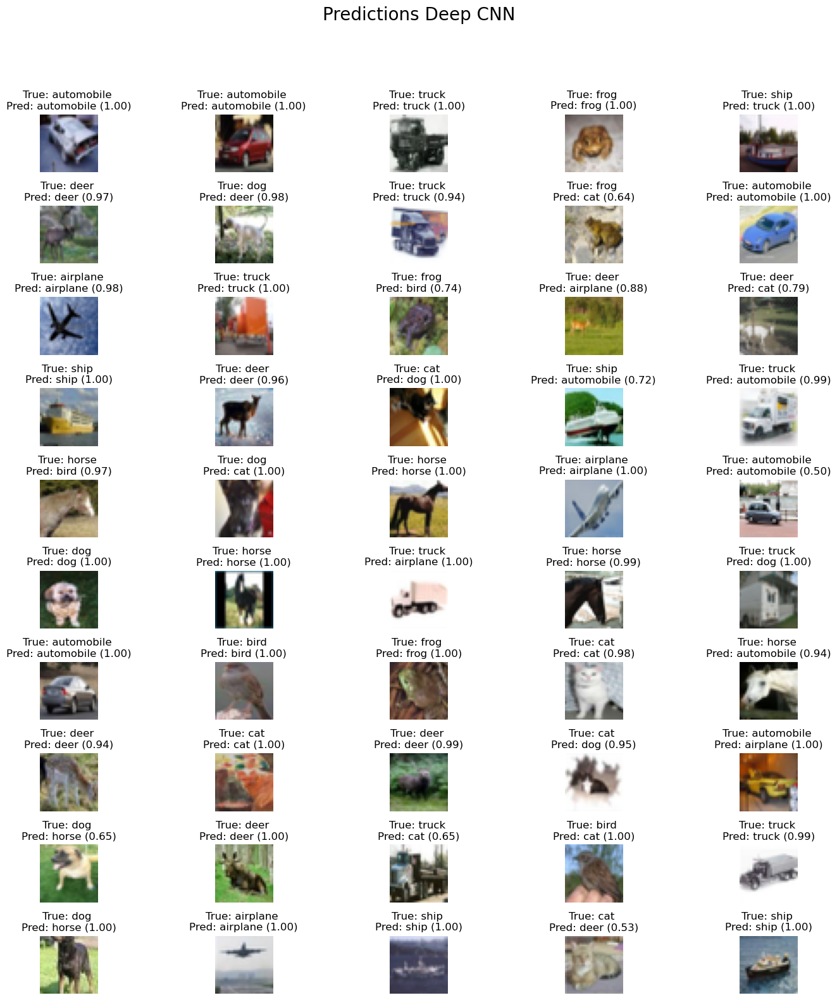

In [24]:
idx = np.random.choice(np.arange(len(x_test)), 50)

fig, ax = plt.subplots(10, 5, figsize=(15, 15))
# Plot the images with the predictions and probabilities
ax = ax.ravel()
for num, i in enumerate(idx):
    pred = y_pred_deep[i]
    true = y_test[i].argmax()
    prob = y_proba_deep[i, pred]
    ax[num].imshow(x_test[i])
    ax[num].set_title("True: %s \nPred: %s (%.2f)" % (labels[true], labels[pred], prob))
    
    ax[num].axis('off')
plt.suptitle("Predictions Deep CNN", y=1.05, fontsize=20)
plt.tight_layout()

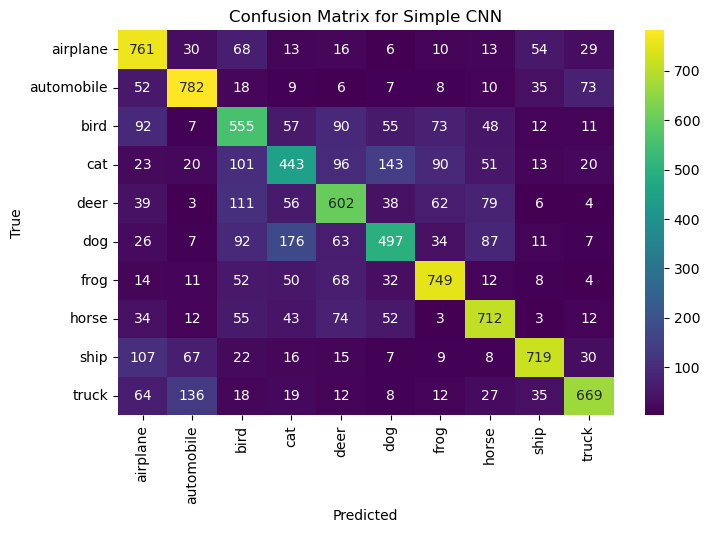

In [33]:
# COnfusion Matrix for Simple CNN
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_test.argmax(axis=1), y_pred)

fig, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(cm, annot=True, ax=ax, cmap='viridis', fmt='.0f')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix for Simple CNN')
ax.xaxis.set_ticklabels(labels, rotation='vertical')
ax.yaxis.set_ticklabels(labels, rotation='horizontal')
plt.show()

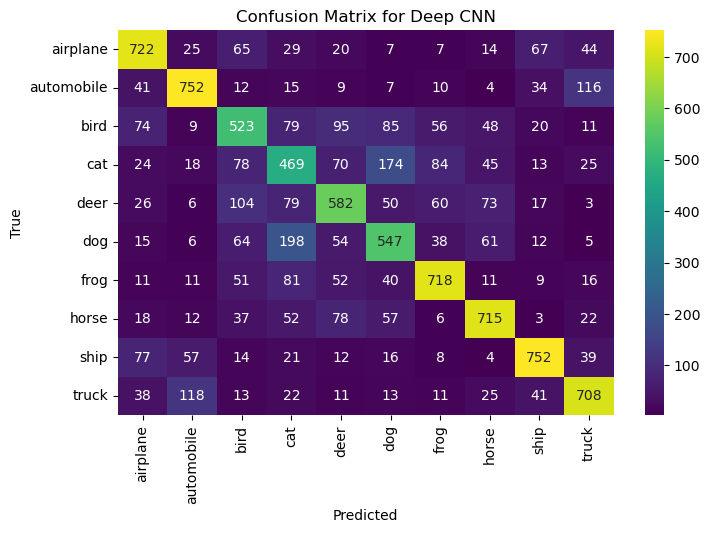

In [34]:
# COnfusion Matrix for Deep CNN
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_test.argmax(axis=1), y_pred_deep)

fig, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(cm, annot=True, ax=ax, cmap='viridis', fmt='.0f')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix for Deep CNN')
ax.xaxis.set_ticklabels(labels, rotation='vertical')
ax.yaxis.set_ticklabels(labels, rotation='horizontal')
plt.show()

**Solution**

Simple model works pretty similar to the 2 conv one. In both cases it confuses a lot of classes such as `automobile` and `truck` (118 errors out of 826) or dog and cat (198 errors out of 795). The model is not able to distinguish between these classes. This is not surprising, since these classes share some similarities. For example, the automobile and truck classes share the same shape, and the dog and cat classes share the same shapes and backgrounds in some of cases.

*    Print the test accuracy for the trained model.

In [27]:
# solution

_, model_accuracy_test = model.evaluate(x_test, y_test, verbose=0)
print("Test Accuracy for Simple CNN (1 Conv): %.2f" % model_accuracy_test)

_, model_deep_accuracy_test = model_deep.evaluate(x_test, y_test, verbose=0)
print("Test Accuracy for Deep CNN (2 Convs): %.2f" % model_deep_accuracy_test)


Test Accuracy for Simple CNN (1 Conv): 0.65
Test Accuracy for Deep CNN (2 Convs): 0.65


## Define the complete VGG architecture.

**Stack two convolutional layers with 64 filters, each of 3 x 3 followed by max pooling layer. Stack two more convolutional layers with 128 filters, each of 3 x 3, followed by max pooling, follwed by two more convolutional layers with 256 filters, each of 3 x 3, followed by max pooling. Flatten the output of the previous layer and add a dense layer with 128 units before the classification layer. For all the layers, use ReLU activation function. Use same padding for the layers to ensure that the height and width of each layer output matches the input**

*   Change the size of input to 64 x 64.

In [23]:
from keras.backend import clear_session
clear_session()

In [24]:
# solution

vgg_scratch = [keras.layers.InputLayer(input_shape=INPUT_SHAPE),
               keras.layers.Resizing(64, 64, interpolation='bilinear'),
                keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'),
                keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same'),
                keras.layers.MaxPooling2D(pool_size=(2, 2)),
                keras.layers.Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'),
                keras.layers.Conv2D(128, kernel_size=(3, 3), activation='relu', padding='same'),
                keras.layers.MaxPooling2D(pool_size=(2, 2)),
                keras.layers.Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'),
                keras.layers.Conv2D(256, kernel_size=(3, 3), activation='relu', padding='same'),
                keras.layers.MaxPooling2D(pool_size=(2, 2)),
                keras.layers.Flatten(),
                keras.layers.Dense(128, activation='relu'),
                keras.layers.Dense(NUM_CLASSES, activation='softmax')]
vgg_scratch = Sequential(vgg_scratch)
vgg_scratch.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 64, 64, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 64)        1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 32, 32, 64)        0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 32, 32, 128)       147584    
                                                        

*   Compile the model using categorical_crossentropy loss, SGD optimizer and use 'accuracy' as the metric.
*   Use the above defined model to train CIFAR-10 and train the model for 100 epochs with a batch size of 32.
*   Predict the output for the test split and plot the confusion matrix for the new model and comment on the class confusions.

In [25]:
# solution
BATCH_SIZE = 32
EPOCHS = 30
LEARNING_RATE = 0.01
vgg_scratch.compile(loss=keras.losses.CategoricalCrossentropy(),
                optimizer=keras.optimizers.SGD(learning_rate=LEARNING_RATE),
                metrics=['accuracy'])

history_vgg_scratch = vgg_scratch.fit(x_train, y_train,
                                batch_size=BATCH_SIZE,
                                epochs=EPOCHS,
                                verbose=1,
                                validation_data=(x_test, y_test))

Epoch 1/30
1563/1563 [==============================] - 24s 14ms/step - loss: 1.9474 - accuracy: 0.2923 - val_loss: 1.6275 - val_accuracy: 0.4205
Epoch 2/30
1563/1563 [==============================] - 22s 14ms/step - loss: 1.4642 - accuracy: 0.4783 - val_loss: 1.4175 - val_accuracy: 0.4913
Epoch 3/30
1563/1563 [==============================] - 21s 14ms/step - loss: 1.2626 - accuracy: 0.5507 - val_loss: 1.2166 - val_accuracy: 0.5613
Epoch 4/30
1563/1563 [==============================] - 21s 14ms/step - loss: 1.1031 - accuracy: 0.6125 - val_loss: 1.1236 - val_accuracy: 0.5948
Epoch 5/30
1563/1563 [==============================] - 21s 14ms/step - loss: 0.9601 - accuracy: 0.6623 - val_loss: 1.0444 - val_accuracy: 0.6322
Epoch 6/30
1563/1563 [==============================] - 21s 14ms/step - loss: 0.8359 - accuracy: 0.7071 - val_loss: 1.0527 - val_accuracy: 0.6385
Epoch 7/30
1563/1563 [==============================] - 21s 14ms/step - loss: 0.7083 - accuracy: 0.7529 - val_loss: 0.9937 -

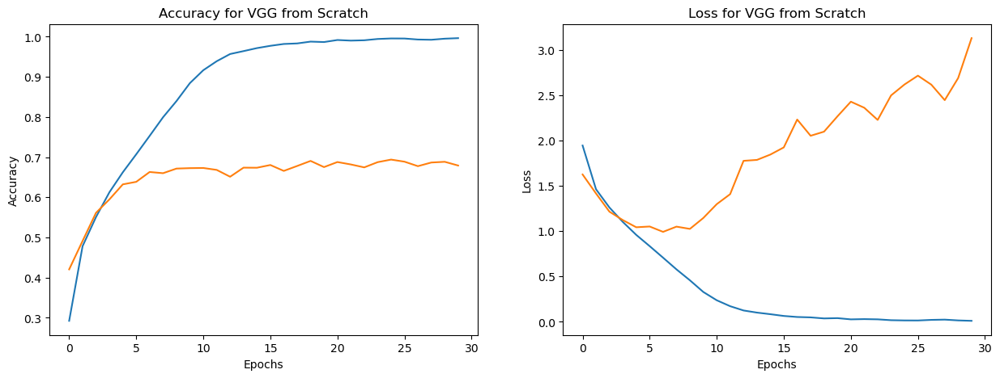

In [26]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(history_vgg_scratch.history['accuracy'], label='train')
ax[0].plot(history_vgg_scratch.history['val_accuracy'], label='test')
ax[0].set_title("Accuracy for VGG from Scratch")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(history_vgg_scratch.history['loss'], label='train')
ax[1].plot(history_vgg_scratch.history['val_loss'], label='test')
ax[1].set_title("Loss for VGG from Scratch")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

313/313 [==============================] - 1s 5ms/step


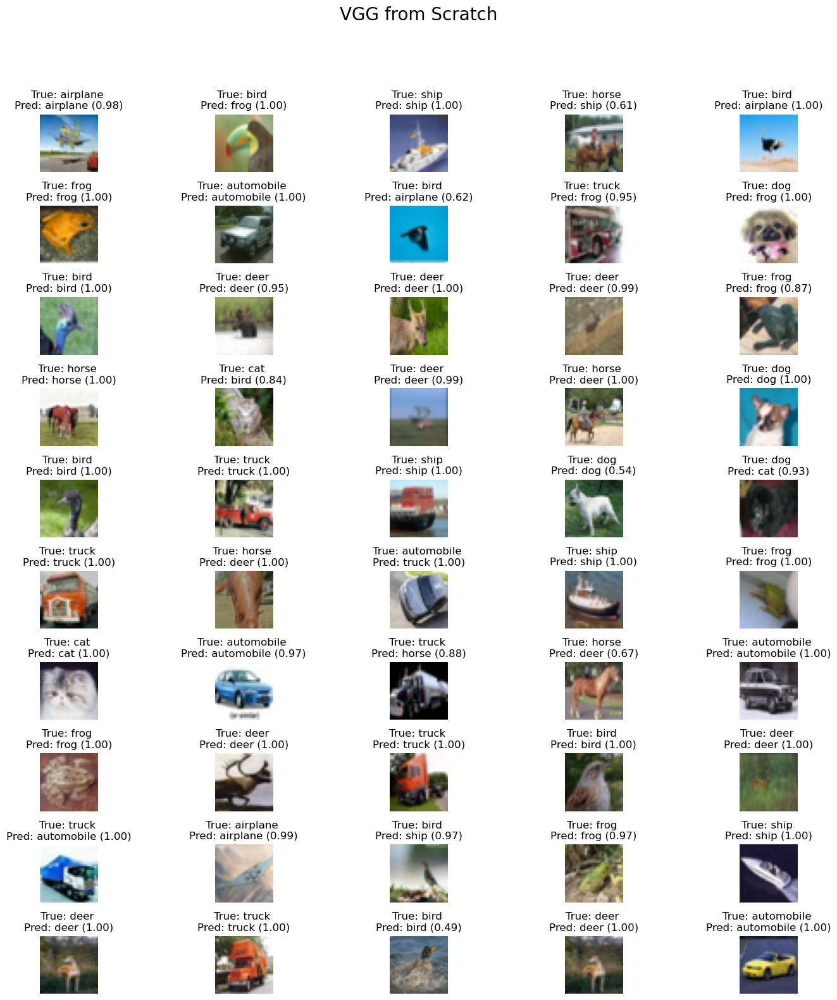

In [27]:
y_proba_vgg_scratch = vgg_scratch.predict(x_test)
y_pred_vgg_scratch = np.argmax(y_proba_vgg_scratch, axis=1)

idx = np.random.choice(np.arange(len(x_test)), 50)

fig, ax = plt.subplots(10, 5, figsize=(15, 15))
# Plot the images with the predictions and probabilities
ax = ax.ravel()
for num, i in enumerate(idx):
    pred = y_pred_vgg_scratch[i]
    true = y_test[i].argmax()
    prob = y_proba_vgg_scratch[i, pred]
    ax[num].imshow(x_test[i])
    ax[num].set_title("True: %s \nPred: %s (%.2f)" % (labels[true], labels[pred], prob))
    
    ax[num].axis('off')

plt.suptitle("VGG from Scratch", y=1.05, fontsize=20)
plt.tight_layout()

# Understanding deep networks

*   What is the use of activation functions in network? Why is it needed?
*   We have used softmax activation function in the exercise. There are other activation functions available too. What is the difference between sigmoid activation and softmax activation?
*   What is the difference between categorical crossentropy and binary crossentropy loss?

**Solution**

**What is the use of activation functions in network? Why is it needed?**

Activation functions are essential components of neural networks that introduce non-linearity into the network. Without activation functions, neural networks would simply be linear models, which are incapable of learning complex patterns and relationships in data. This allows neural networks to learn complex decision boundaries and make predictions that go beyond simple linear relationships.

In addition to introducing non-linearity, activation functions also help to ensure that the network's output remains within a specific range. For instance, the sigmoid activation function squashes the output between 0 and 1, making it suitable for tasks like binary classification.

**We have used softmax activation function in the exercise. There are other activation functions available too. What is the difference between sigmoid activation and softmax activation?**

We have used softmax activation function in the exercise. There are other activation functions available too. What is the difference between sigmoid activation and softmax activation?

Both sigmoid and softmax activation functions are used to introduce non-linearity into neural networks. However, they differ in their intended applications.

Sigmoid activation function is typically used for binary classification tasks, where the network outputs a probability between 0 and 1, indicating the likelihood of the input belonging to one of two classes.

Softmax activation function, on the other hand, is used for multi-class classification tasks, where the network outputs a probability distribution over multiple classes. The softmax function ensures that the probabilities for all classes sum to 1.

**What is the difference between categorical crossentropy and binary crossentropy loss?**

Categorical crossentropy and binary crossentropy are both loss functions used to measure the discrepancy between the predicted output of a neural network and the true labels. They are both based on the concept of entropy, which measures the uncertainty or randomness of a distribution.

Categorical crossentropy is used for multi-class classification tasks, while binary crossentropy is used for binary classification tasks. The difference lies in how the entropy is calculated for each class.

In binary crossentropy, the entropy is calculated based on the probability of the correct class and the probability of the incorrect class. In categorical crossentropy, the entropy is calculated for each class, and the sum of the entropies for all classes is used.

The choice of loss function depends on the specific classification task at hand. If the task is to classify an input into one of two categories, then binary crossentropy is appropriate. If the task is to classify an input into one of multiple categories, then categorical crossentropy should be used.

# Transfer Learning

It is not always necessary to train models from scratch. We can use the knowledge of networks trained on other tasks to learn the task at hand. In this exercise, we will explore the use of pre-trained weights and train on the CIFAR-10 dataset.

*   Create a base imagenet pretrained InceptionV3 model.
    *    Hint: Use tf.keras.applications to create the model
    *    Pay attention to the include_top parameter.


In [28]:
from keras.backend import clear_session
clear_session()

In [29]:
# solution

from keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions

inception = InceptionV3(weights='imagenet', include_top=False)
inception.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, None, None, 32)       96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, None, None, 32)       0         ['batch_normalizati

*    Add a global average pooling layer, followed by a fully-connected layer with 1024 neurons and then the classification layer.

In [30]:
# solution
import keras
from keras.models import Sequential

INPUT_SHAPE = (32, 32, 3)
model_inception = [keras.layers.InputLayer(input_shape=INPUT_SHAPE),
                   keras.layers.Resizing(299, 299, interpolation='bilinear'),
                   inception,
                   keras.layers.GlobalAveragePooling2D(),
                   keras.layers.Dense(1024, activation='relu'),
                   keras.layers.Dense(NUM_CLASSES, activation='softmax')]
model_inception = Sequential(model_inception)
model_inception.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 299, 299, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, None, None, 2048   21802784  
                             )                                   
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1024)              2098176   
                                                                 
 dense_1 (Dense)             (None, 10)                10250     
                                                                 
Total params: 23911210 (91.21 MB)
Trainable params: 2387

*   Train the model by freezing the base model. Train only the newly added layers.
    *    Hint: Every layer has an attribute called 'trainable'
*   Compile the model and train the model for a few epochs only.

In [31]:
# solution

for layer in model_inception.layers[:-3]:
    print(layer.name)
    layer.trainable = False

model_inception.summary()

resizing
inception_v3
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 299, 299, 3)       0         
                                                                 
 inception_v3 (Functional)   (None, None, None, 2048   21802784  
                             )                                   
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1024)              2098176   
                                                                 
 dense_1 (Dense)             (None, 10)                10250     
                                                                 
Total params: 23911210 (91.21 MB)


In [32]:
for layer in model_inception.layers:
    print(layer.name, layer.trainable)

resizing False
inception_v3 False
global_average_pooling2d True
dense True
dense_1 True


In [33]:
model_inception.compile(loss=keras.losses.CategoricalCrossentropy(),
                        optimizer=keras.optimizers.SGD(),
                        metrics=['accuracy'])

EPOCHS = 10
history_inception = model_inception.fit(x_train, y_train,
                                        batch_size=BATCH_SIZE,
                                        epochs=EPOCHS,
                                        verbose=1,
                                        validation_data=(x_test, y_test))

Epoch 1/10
1563/1563 [==============================] - 102s 63ms/step - loss: 0.6830 - accuracy: 0.7777 - val_loss: 0.5836 - val_accuracy: 0.7991
Epoch 2/10
1563/1563 [==============================] - 98s 63ms/step - loss: 0.4974 - accuracy: 0.8282 - val_loss: 0.5109 - val_accuracy: 0.8238
Epoch 3/10
1563/1563 [==============================] - 98s 63ms/step - loss: 0.4547 - accuracy: 0.8416 - val_loss: 0.4777 - val_accuracy: 0.8367
Epoch 4/10
1563/1563 [==============================] - 98s 63ms/step - loss: 0.4258 - accuracy: 0.8509 - val_loss: 0.4824 - val_accuracy: 0.8350
Epoch 5/10
1563/1563 [==============================] - 98s 63ms/step - loss: 0.4068 - accuracy: 0.8595 - val_loss: 0.4584 - val_accuracy: 0.8437
Epoch 6/10
1563/1563 [==============================] - 98s 63ms/step - loss: 0.3881 - accuracy: 0.8642 - val_loss: 0.4752 - val_accuracy: 0.8362
Epoch 7/10
1563/1563 [==============================] - 98s 63ms/step - loss: 0.3723 - accuracy: 0.8711 - val_loss: 0.4505 

*    Freeze the bottom layers and unfreeze the base layers.
*    Compile and train the classifier with a very low learning rate (0.0001)

In [34]:
# Unfreeze the base layers to retrain convolutional ones
for layer in model_inception.layers[:-3]:
    print(layer.name)
    layer.trainable = True

# Freeze the classification layers
for layer in model_inception.layers[-3:]:
    print(layer.name, layer.trainable)
    layer.trainable = False

model_inception.compile(loss=keras.losses.CategoricalCrossentropy(),
                        optimizer=keras.optimizers.SGD(learning_rate=0.0001),
                        metrics=['accuracy'])

EPOCHS = 10
history_inception_retrained = model_inception.fit(x_train, y_train,
                                                    batch_size=BATCH_SIZE,
                                                    epochs=EPOCHS,
                                                    verbose=1,
                                                    validation_data=(x_test, y_test))

resizing
inception_v3
global_average_pooling2d True
dense True
dense_1 True
Epoch 1/10


2023-12-01 00:32:13.580988: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.77GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


1563/1563 [==============================] - 329s 202ms/step - loss: 0.8265 - accuracy: 0.7277 - val_loss: 0.5285 - val_accuracy: 0.8246
Epoch 2/10
1563/1563 [==============================] - 310s 199ms/step - loss: 0.5076 - accuracy: 0.8323 - val_loss: 0.4390 - val_accuracy: 0.8556
Epoch 3/10
1563/1563 [==============================] - 310s 199ms/step - loss: 0.4126 - accuracy: 0.8627 - val_loss: 0.3483 - val_accuracy: 0.8831
Epoch 4/10
1563/1563 [==============================] - 310s 199ms/step - loss: 0.3654 - accuracy: 0.8787 - val_loss: 0.3167 - val_accuracy: 0.8931
Epoch 5/10
1563/1563 [==============================] - 310s 199ms/step - loss: 0.3299 - accuracy: 0.8901 - val_loss: 0.3015 - val_accuracy: 0.8983
Epoch 6/10
1563/1563 [==============================] - 310s 199ms/step - loss: 0.2974 - accuracy: 0.9008 - val_loss: 0.2766 - val_accuracy: 0.9082
Epoch 7/10
1563/1563 [==============================] - 310s 199ms/step - loss: 0.2731 - accuracy: 0.9105 - val_loss: 0.260

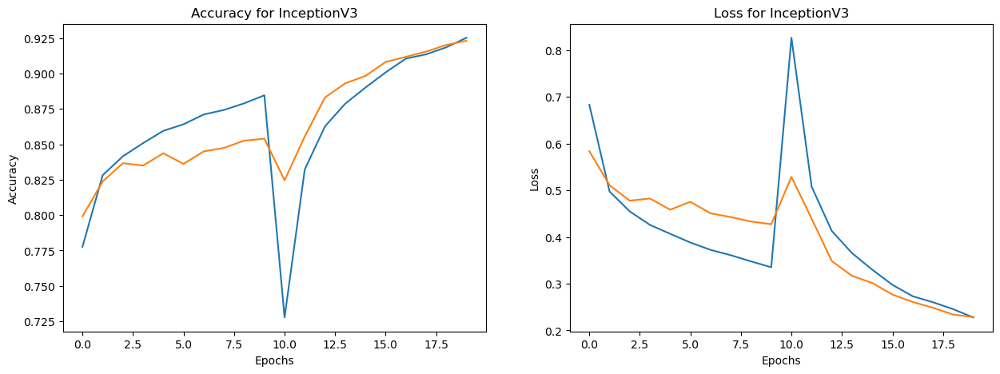

In [35]:
history_inception_merged = {}
history_inception_merged['accuracy'] = history_inception.history['accuracy'] + history_inception_retrained.history['accuracy']
history_inception_merged['loss'] = history_inception.history['loss'] + history_inception_retrained.history['loss']
history_inception_merged['val_accuracy'] = history_inception.history['val_accuracy'] + history_inception_retrained.history['val_accuracy']
history_inception_merged['val_loss'] = history_inception.history['val_loss'] + history_inception_retrained.history['val_loss']

fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].plot(history_inception_merged['accuracy'], label='train')
ax[0].plot(history_inception_merged['val_accuracy'], label='test')
ax[0].set_title("Accuracy for InceptionV3")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")


ax[1].plot(history_inception_merged['loss'], label='train')
ax[1].plot(history_inception_merged['val_loss'], label='test')
ax[1].set_title("Loss for InceptionV3")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

*    Compare the performance of the VGG model and the Inception-V3 model.

313/313 [==============================] - 16s 50ms/step


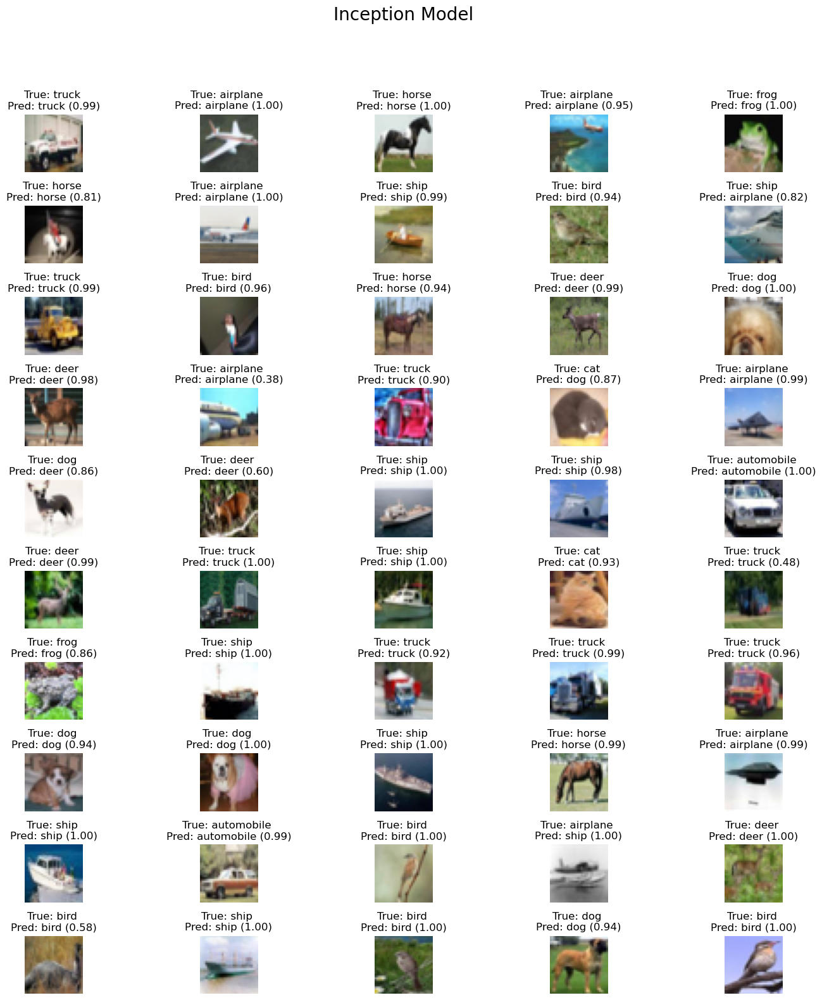

In [68]:
y_proba_inception = model_inception.predict(x_test)
y_pred_inception = np.argmax(y_proba_inception, axis=1)

idx = np.random.choice(np.arange(len(x_test)), 50)

fig, ax = plt.subplots(10, 5, figsize=(15, 15))
# Plot the images with the predictions and probabilities
ax = ax.ravel()
for num, i in enumerate(idx):
    pred = y_pred_inception[i]
    true = y_test[i].argmax()
    prob = y_proba_inception[i, pred]
    ax[num].imshow(x_test[i])
    ax[num].set_title("True: %s \nPred: %s (%.2f)" % (labels[true], labels[pred], prob))
    
    ax[num].axis('off')

plt.suptitle("Inception Model", y=1.05, fontsize=20)
plt.tight_layout()

**Solution**

*    Compare the performance of the VGG model and the Inception-V3 model.

The Inception-V3 model performs better than the VGG model. The Inception-V3 model gets accuracy over 90% while VGG model gets stucked aroung 70%. This is because the Inception-V3 model is a deeper model with more layers and more parameters. It is able to learn more complex patterns and relationships in the data.

*    When do we train models from scratch? What are the potential issues in training models from scratch?

**Solution**

Training a model from scratch involves building a neural network architecture and initializing its parameters randomly. This approach is typically used when there is no existing model that is well-suited for the task at hand or when the available data is significantly different from the data used to train existing models.

**When to Train Models from Scratch:**

* **Novel Tasks**: When dealing with entirely new tasks or problem domains where there are no existing models that can be adapted or fine-tuned, training from scratch may be the best option.

* **Unique Data**: If the data used for training is significantly different from the data used to train existing models, such as in terms of language, style, or domain-specific terminology, training from scratch can lead to better performance.

* **Limited Pre-trained Models**: In cases where there are no pre-trained models available for the specific task or data, training from scratch is the only option.

**Potential Issues in Training Models from Scratch:**

* **Computational Cost**: Training a model from scratch can be computationally expensive, requiring significant hardware resources and time.

* **Data Requirements**: Training from scratch typically requires large amounts of high-quality data to achieve good performance.

* **Hyperparameter Tuning**: Selecting the appropriate hyperparameters, such as learning rate, optimizer, and network architecture, can be a complex and time-consuming process.

* **Overfitting**: Overfitting, where the model performs well on training data but poorly on unseen data, is a common issue when training models from scratch.

**Alternatives to Training from Scratch:**

* **Fine-tuning Pre-trained Models**: Instead of training a model from scratch, it is often more efficient and effective to fine-tune an existing pre-trained model on the specific task and data.

**Transfer Learning**: Transfer learning involves leveraging the knowledge learned from a pre-trained model on a related task to improve performance on the new task.

The decision of whether to train a model from scratch or use an alternative approach depends on the specific task, data availability, computational resources, and performance requirements.

*    Why do we use pre-trained weights?
*    What is the difference between using random initialization and using weights from a pre-trained model?

**Solution**

**Advantages of Using Pre-trained Weights:**

* **Reduced Training Time:** Pre-trained weights provide a good starting point for the model's parameters, allowing it to learn more efficiently. This can significantly reduce training time, especially for large and complex models.

* **Improved Performance:** Pre-trained weights often encode general-purpose features that are relevant to a wide range of tasks. By leveraging these features, the model can achieve better performance on the specific task at hand.

* **Reduced Overfitting:** Pre-trained weights can help to reduce overfitting by providing a more regularized initialization for the model's parameters. Overfitting occurs when the model learns the training data too well and fails to generalize to new data.

**Differences between Random Initialization and Pre-trained Weights:**

* **Random Initialization:** Randomly initializing weights assigns random values to all parameters in the model. This can lead to slow and unstable training, as the model may struggle to find good directions to optimize.

* **Pre-trained Weights:** Pre-trained weights, on the other hand, provide a more informed initialization for the model's parameters. These weights have already been optimized for a related task, giving the model a better starting point for learning the new task.

**When to Use Pre-trained Weights:**

* **Fine-tuning Pre-trained Models:** Pre-trained weights are often used to fine-tune existing models for new tasks. Fine-tuning involves adjusting the pre-trained weights to better fit the specific requirements of the new task.

* **Transfer Learning:** Pre-trained weights can also be used for transfer learning, where knowledge learned from one task is transferred to improve performance on another task.

Using pre-trained weights can significantly improve the training process, performance, and generalizability of neural networks. However, it is important to select appropriate pre-trained weights that are relevant to the specific task and data.

# Extracting features from Deep Networks

It is quite possible to extract features (similar to SIFT or ORB) from different layers of deep network.

*   Load ResNet50 model with imagenet weights and check the summary of the model
*   Create a model to extract features from the 'avg_pool' layer.
*   Extract features from the layer for all the train images.
*   Use the extracted features to train a SVM classifier.
    *    Use GridSearchCV and SVC to perform the classification

In [4]:
# solution

# It is quite possible to extract features (similar to SIFT or ORB) from different layers of deep network.

# *   Load ResNet50 model with imagenet weights and check the summary of the model
# *   Create a model to extract features from the 'avg_pool' layer.
# *   Extract features from the layer for all the train images.
# *   Use the extracted features to train a SVM classifier.
#     *    Use GridSearchCV and SVC to perform the classification

from keras.applications.resnet50 import ResNet50
from keras.models import Sequential

resnet = ResNet50(weights='imagenet', include_top=True)
resnet.summary()

# solution

from keras.models import Model
model_resnet = Model(inputs=resnet.input, outputs=resnet.get_layer('avg_pool').output)
extractor = Sequential([keras.layers.InputLayer(input_shape=INPUT_SHAPE),
                        keras.layers.Resizing(224, 224, interpolation='bilinear'),
                        model_resnet])


features_train = extractor.predict(x_train)
features_test = extractor.predict(x_test)

print("Train features:", features_train.shape)
print("Test features:", features_test.shape)


2023-12-01 13:11:46.599125: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-12-01 13:11:46.653648: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-12-01 13:11:46.653755: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

2023-12-01 13:11:48.895178: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-12-01 13:11:48.995993: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:231] Falling back to the CUDA driver for PTX compilation; ptxas does not support CC 8.9
2023-12-01 13:11:48.996003: W tensorflow/compiler/xla/stream_executor/gpu/asm_compiler.cc:234] Used ptxas at ptxas
2023-12-01 13:11:48.996029: W tensorflow/compiler/xla/stream_executor/gpu/redzone_allocator.cc:318] UNIMPLEMENTED: ptxas ptxas too old. Falling back to the driver to compile.
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.
2023-12-01 13:11:49.114480: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


313/313 [==============================] - 14s 45ms/step
Train features: (50000, 2048)
Test features: (10000, 2048)


In [5]:
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV

# Due to memory constraints, and time constraints, we will use 
# an SVC with linear kernel instead of an SVM with RBF kernel
param_grid = {'C': [0.1, 0.5, 1., 3.]}
grid = GridSearchCV(LinearSVC(max_iter=10000, dual='auto'), param_grid, verbose=1, cv=3, n_jobs=-1)

grid.fit(features_train, y_train.argmax(axis=1))

print("Best parameters:", grid.best_params_)
print("Best estimator:", grid.best_estimator_)
print("Best score:", grid.best_score_)
print("Test score:", grid.score(features_test, y_test.argmax(axis=1)))

Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best parameters: {'C': 3.0}
Best estimator: LinearSVC(C=3.0, dual='auto', max_iter=10000)
Best score: 0.5506800196409368
Test score: 0.5575


In [6]:
import pandas as pd
df_scores = pd.DataFrame(grid.cv_results_).sort_values('rank_test_score')
df_scores

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
3,108.206470,3.513874,0.112590,0.010685,3.0,{'C': 3.0},0.546229,0.554149,0.551662,0.55068,0.003307,1
2,102.975347,12.039281,0.124889,0.016499,1.0,{'C': 1.0},0.531649,0.535849,0.532701,0.53340,0.001784,2
1,89.994002,11.300210,0.175803,0.035552,0.5,{'C': 0.5},0.519770,0.523190,0.521421,0.52146,0.001396,3
0,65.603673,4.176104,0.326569,0.048667,0.1,{'C': 0.1},0.485750,0.487550,0.481699,0.48500,0.002447,4


*    Evaluate the trained SVM model using the test set
*    Calculate the accuracy score and confusion matrix

Test Accuracy for SVC: 0.56


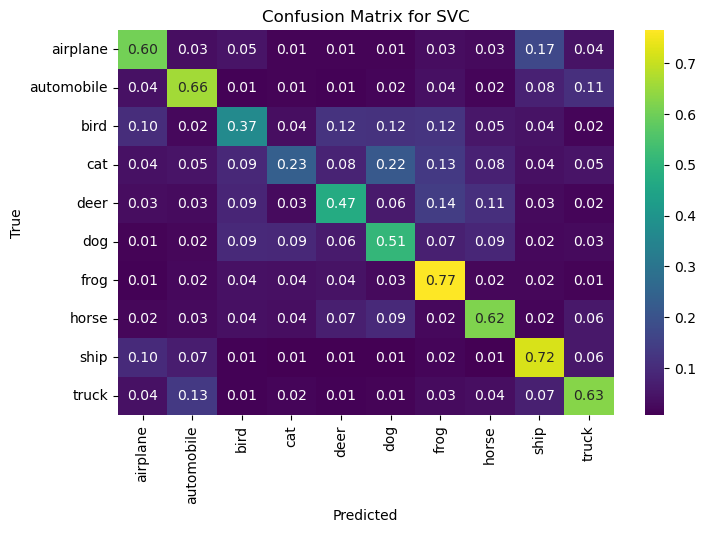

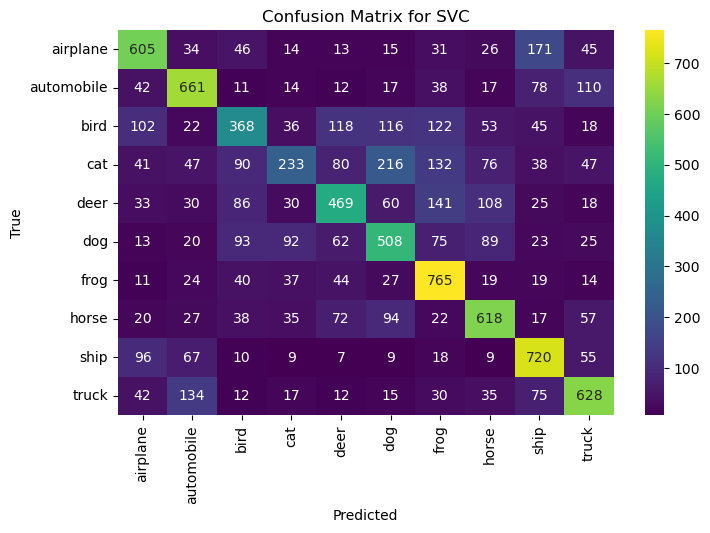

In [35]:
# solution
import numpy as np
import matplotlib.pyplot as plt

svc_model = grid.best_estimator_
y_pred_svc = svc_model.predict(features_test)
print("Test Accuracy for SVC: %.2f" % svc_model.score(features_test, y_test.argmax(axis=1)))

from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(y_test.argmax(axis=1), y_pred_svc)
cm = cm / cm.sum(axis=1)[:, np.newaxis]

fig, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(cm, annot=True, ax=ax, cmap='viridis', fmt='.2f')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix for SVC')
ax.xaxis.set_ticklabels(labels, rotation='vertical')
ax.yaxis.set_ticklabels(labels, rotation='horizontal')
plt.show()

cm = confusion_matrix(y_test.argmax(axis=1), y_pred_svc)

fig, ax = plt.subplots(figsize=(8, 5))
sns.heatmap(cm, annot=True, ax=ax, cmap='viridis', fmt='.0f')
ax.set_xlabel('Predicted')
ax.set_ylabel('True')
ax.set_title('Confusion Matrix for SVC')
ax.xaxis.set_ticklabels(labels, rotation='vertical')
ax.yaxis.set_ticklabels(labels, rotation='horizontal')
plt.show()

In [10]:
from sklearn.metrics import classification_report
print(classification_report(y_test.argmax(axis=1), y_pred_svc, target_names=labels))

              precision    recall  f1-score   support

    airplane       0.60      0.60      0.60      1000
  automobile       0.62      0.66      0.64      1000
        bird       0.46      0.37      0.41      1000
         cat       0.45      0.23      0.31      1000
        deer       0.53      0.47      0.50      1000
         dog       0.47      0.51      0.49      1000
        frog       0.56      0.77      0.64      1000
       horse       0.59      0.62      0.60      1000
        ship       0.59      0.72      0.65      1000
       truck       0.62      0.63      0.62      1000

    accuracy                           0.56     10000
   macro avg       0.55      0.56      0.55     10000
weighted avg       0.55      0.56      0.55     10000



Results aren't very good after extraction. Some other algorithms like Random Forest, KNN, etc. can be tried to improve performance. SVM with gaussian kernel can also be tried but it's computationally too costly due to the vast amount of features extracted (2048) which make applying the kernel trick very expensive.

# Feature Visualizations

In order to visualize the features of a higher dimension data, t-SNE is used. t-SNE converts the affinities of the data points to probabilities. It recreates the probability distribution in a low-dimensional space. It is very helpful in visualizing features of different layers in a neural network.

You can find more information about t-SNE [here](https://scikit-learn.org/stable/modules/manifold.html#t-distributed-stochastic-neighbor-embedding-t-sne)

*    Use TSNE to visualize the features extracted in the previous exercise.
    *    Hint: TSNE function is available in the *sklearn.manifold* package.

In [36]:
# solution

from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipe = Pipeline([('scaler', StandardScaler()), 
                 ('tsne', TSNE(n_components=3, verbose=0))])

features_train_tsne = pipe.fit_transform(features_train)

In [37]:
# REset the default matplotlib color cycle
plt.figure(figsize=(9,8))
# y_labels = [config.LABELS[y] for y in y_exp[embedding[:, 1]>1]]
y_labels_tsne = [labels[y] for y in y_train.argmax(axis=1)]

# now using plotly
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter(x=features_train_tsne[:, 0], y=features_train_tsne[:, 1], color=y_labels_tsne)
# REduce size of the markers
fig.update_traces(marker=dict(size=3))

# Add title and axis names
fig.update_layout(title='TSNE for ResNet Extracted Features', 
                  xaxis_title='t-SNE 1', yaxis_title='t-SNE 2')
fig.show()

<Figure size 900x800 with 0 Axes>

In [38]:
import plotly.io as pio
pio.templates.default = "plotly_white"
fig = px.scatter_3d(features_train_tsne, x=0, y=1, z=2, color=y_labels_tsne, opacity=1.)

fig.update_layout(
    title="3D t-SNE projection of ResNet50 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 1

fig.show()

From t-SNE plot, it is not direct to see the separability of the classes. However, some big groups can be observed to be formed. One of them is the group of transports and not-living-things and the other one is the group of animals. This is a good indicator that the features extracted by the ResNet50 model are able to capture the differences between the different classes.

To try to get better insights, another visualization technique will be used: UMAP.

In [39]:
import umap

pipe_umap = Pipeline([('scaler', StandardScaler()), 
                 ('tsne', umap.UMAP(n_components=3))])

features_train_umap = pipe_umap.fit_transform(features_train)

/home/alberto/anaconda3/envs/tensorflow/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



In [40]:
import plotly.io as pio
pio.templates.default = "plotly_white"
fig = px.scatter_3d(features_train_umap, x=0, y=1, z=2, color=y_labels_tsne, opacity=1.)

fig.update_layout(
    title="3D UMAP projection of ResNet50 features",
    scene = dict(
        xaxis_title='x',
        yaxis_title='y',
        zaxis_title='z'
    )
)

# REduce marker size
for i in range(len(fig.data)):
    fig.data[i].marker.size = 1

fig.show()

*    Why is feature visualization helpful?

**Solution**

Feature visualization is a technique used to understand the inner workings of machine learning models, particularly deep neural networks. It involves creating visual representations of the features learned by the model, allowing us to gain insights into what the model is paying attention to and how it makes decisions.

**Key Benefits of Feature Visualization:**

1. **Understanding Model Behavior:** Feature visualization helps us understand how the model is processing and interpreting the input data. It reveals which features are most important for the model's predictions and how different features interact with each other.

2. **Detecting Biases:** Feature visualization can help identify potential biases in the model's decision-making process. By examining how the model reacts to different inputs, we can uncover biases that may lead to unfair or discriminatory outcomes.

3. **Improving Model Performance:** Understanding the model's feature space can guide us in improving its performance. By identifying weak or irrelevant features, we can refine the model's architecture or data preprocessing steps.

4. **Debugging Model Errors:** Feature visualization can be used to debug model errors and identify potential issues in the training process. By examining how the model responds to specific inputs, we can pinpoint where the model is making mistakes and address those issues.

5. **Explaining Model Predictions:** Feature visualization can help explain the model's predictions to stakeholders and non-experts. By providing visual representations of the features that influenced the model's decision, we can make the model's reasoning more transparent and understandable.

**Applications of Feature Visualization:**

* **Natural Language Processing (NLP):** Visualizing word embeddings and attention mechanisms in NLP models helps understand how the model represents language and identifies the most relevant words for a given task.

* **Computer Vision (CV):** Visualizing activation maps and feature saliency in CV models helps identify the regions of an image that the model is focusing on and understand how it makes object recognition decisions.

* **Recommender Systems:** Visualizing user embeddings and item embeddings in recommender systems helps understand user preferences and item characteristics, enabling better recommendations.

* **Anomaly Detection:** Visualizing feature distributions and anomalies in anomaly detection models helps identify unusual patterns or outliers in the data, enabling early detection of potential problems.